In [82]:
!pip install seaborn xgboost

In [83]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import  accuracy_score,classification_report,ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

In [84]:
df1 = pd.read_csv("/content/2021.csv")
df2 = pd.read_csv("/content/2022.csv")
df3 = pd.read_csv("/content/2023.csv")

In [85]:
df1.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44,6.03,292.6,8.6,D,0
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37,6.03,287.4,9.0,D,0
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547,Terra,MODIS,8,6.03,286.5,5.4,D,0
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46,6.03,287.7,10.7,D,0
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43,6.03,287.6,9.0,D,0


In [86]:
df2.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,30.1138,80.0756,300.0,1.2,1.1,2022-01-01,511,Terra,MODIS,7,6.03,288.4,7.1,D,0
1,23.7726,86.2078,306.1,1.6,1.2,2022-01-01,512,Terra,MODIS,62,6.03,293.5,10.4,D,2
2,22.2080,84.8627,304.8,1.4,1.2,2022-01-01,512,Terra,MODIS,42,6.03,293.3,5.8,D,2
3,23.7621,86.3946,306.9,1.6,1.2,2022-01-01,512,Terra,MODIS,38,6.03,295.2,9.3,D,2
4,23.6787,86.0891,303.6,1.5,1.2,2022-01-01,512,Terra,MODIS,52,6.03,293.1,7.2,D,2


In [87]:
df3.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,9.3280,77.6247,318.0,1.1,1.0,2023-01-01,821,Aqua,MODIS,62,61.03,305.0,7.6,D,0
1,10.4797,77.9378,313.8,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,299.4,4.3,D,0
2,13.2478,77.2639,314.7,1.0,1.0,2023-01-01,822,Aqua,MODIS,55,61.03,302.4,4.9,D,0
3,12.2994,78.4085,314.3,1.0,1.0,2023-01-01,822,Aqua,MODIS,58,61.03,301.9,4.8,D,0
4,14.1723,75.5024,338.4,1.2,1.1,2023-01-01,823,Aqua,MODIS,88,61.03,305.3,41.5,D,0


In [88]:
df = pd.concat([df1, df2, df3], ignore_index=True)
df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44,6.03,292.6,8.6,D,0
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37,6.03,287.4,9.0,D,0
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,547,Terra,MODIS,8,6.03,286.5,5.4,D,0
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46,6.03,287.7,10.7,D,0
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43,6.03,287.6,9.0,D,0


In [89]:
df.shape

(271217, 15)

In [90]:
df.info

<bound method DataFrame.info of         latitude  longitude  brightness  scan  track    acq_date  acq_time  \
0        28.0993    96.9983       303.0   1.1    1.1  2021-01-01       409   
1        30.0420    79.6492       301.8   1.4    1.2  2021-01-01       547   
2        30.0879    78.8579       300.2   1.3    1.1  2021-01-01       547   
3        30.0408    80.0501       302.0   1.5    1.2  2021-01-01       547   
4        30.6565    78.9668       300.9   1.3    1.1  2021-01-01       547   
...          ...        ...         ...   ...    ...         ...       ...   
271212   17.1067    74.4049       304.0   2.3    1.5  2023-12-31      1715   
271213   16.3284    75.2590       304.2   2.6    1.5  2023-12-31      1715   
271214   21.1095    72.6422       306.5   1.9    1.3  2023-12-31      1716   
271215   21.0664    72.8734       310.0   1.0    1.0  2023-12-31      2125   
271216   21.0679    72.8637       316.9   1.0    1.0  2023-12-31      2125   

       satellite instrument  confidence  version  bright_t31   frp daynight  \
0          Terra      MODIS          44     6.03       292.6   8.6        D   
1          Terra      MODIS          37     6.03       287.4   9.0        D   
2          Terra      MODIS           8     6.03       286.5   5.4        D   
3          Terra      MODIS          46     6.03       287.7  10.7        D   
4          Terra      MODIS          43     6.03       287.6   9.0        D   
...          ...        ...         ...      ...         ...   ...      ...   
271212     Terra      MODIS          58    61.03       289.2  23.2        N   
271213     Terra      MODIS          59    61.03       288.9  29.5        N   
271214     Terra      MODIS          68    61.03       294.2  18.2        N   
271215      Aqua      MODIS          79    61.03       292.7  10.2        N   
271216      Aqua      MODIS          94    61.03       293.1  16.0        N   

        type  
0          0  
1          0  
2          0  
3          0  
4          0  
...      ...  
271212     0  
271213     0  
271214     2  
271215     2  
271216     2  

[271217 rows x 15 columns]>

In [91]:
df.isnull().sum()

,0
latitude,0
longitude,0
brightness,0
scan,0
track,0
acq_date,0
acq_time,0
satellite,0
instrument,0
confidence,0


In [92]:
df.duplicated().sum()

np.int64(0)

In [93]:
df.columns

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_date',
       'acq_time', 'satellite', 'instrument', 'confidence', 'version',
       'bright_t31', 'frp', 'daynight', 'type'],
      dtype='object')

In [94]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,271217.0,23.947505,4.919846,8.1362,20.9655,23.7888,27.7827,34.9734
longitude,271217.0,81.284024,6.559071,68.4526,75.8802,79.3209,84.7559,97.1044
brightness,271217.0,323.719192,14.147221,300.0000,314.5000,322.0000,330.7000,505.7000
scan,271217.0,1.421732,0.630742,1.0000,1.0000,1.2000,1.5000,4.8000
track,271217.0,1.152716,0.201943,1.0000,1.0000,1.1000,1.2000,2.0000
acq_time,271217.0,824.623755,353.966965,321.0000,648.0000,756.0000,825.0000,2202.0000
confidence,271217.0,64.065081,18.165329,0.0000,54.0000,66.0000,76.0000,100.0000
version,271217.0,21.933778,24.935515,6.0300,6.0300,6.0300,61.0300,61.0300
bright_t31,271217.0,303.499177,8.282440,267.2000,298.2000,302.5000,309.2000,400.1000
frp,271217.0,27.722058,81.017471,0.0000,8.7000,13.5000,24.5000,6961.8000


In [95]:
df.type.value_counts()

,count
type,
0,257625
2,13550
3,42


In [96]:
for col in df.columns:
  if df[col].dtype == 'object':
    print(f"Column: {col}")
    print(f"Unique values: {df[col].unique()}")
    print(f"Number of unique values: {df[col].nunique()}")
    print("-" * 50)

Column: acq_date
Unique values: ['2021-01-01' '2021-01-02' '2021-01-03' ... '2023-12-29' '2023-12-30'
 '2023-12-31']
Number of unique values: 1088
--------------------------------------------------
Column: satellite
Unique values: ['Terra' 'Aqua']
Number of unique values: 2
--------------------------------------------------
Column: instrument
Unique values: ['MODIS']
Number of unique values: 1
--------------------------------------------------
Column: daynight
Unique values: ['D' 'N']
Number of unique values: 2
--------------------------------------------------


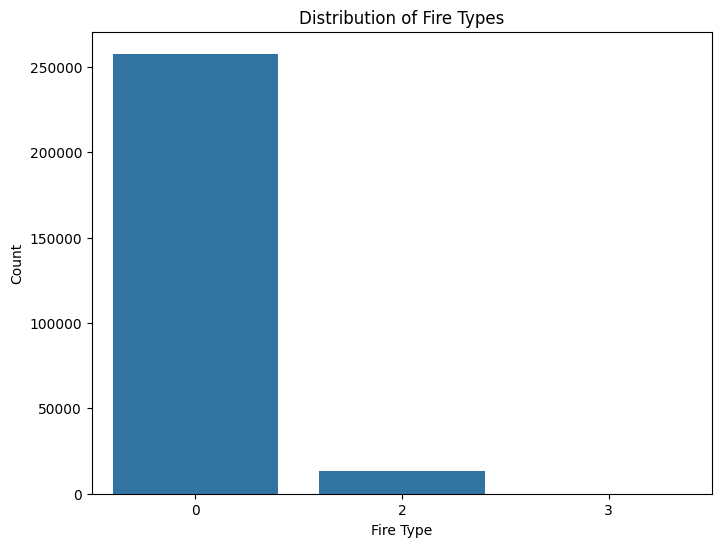

In [97]:
plt.figure(figsize=(8, 6))
sns.countplot(x='type', data=df)
plt.title('Distribution of Fire Types')
plt.xlabel('Fire Type')
plt.ylabel('Count')
plt.show()

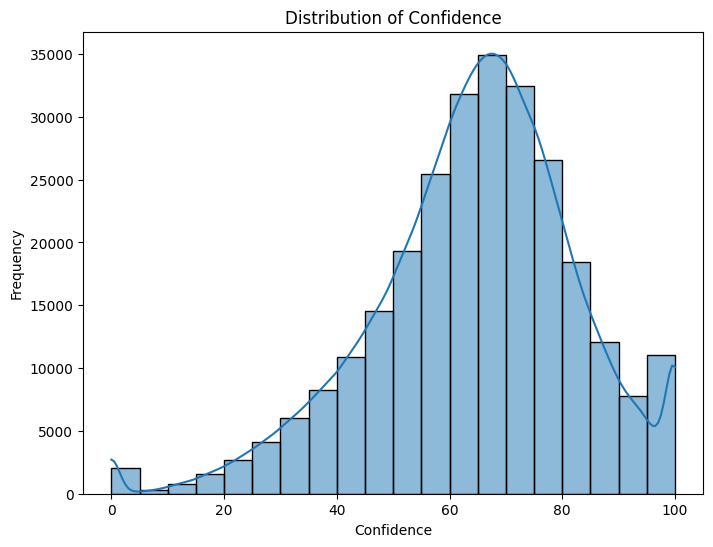

In [98]:
plt.figure(figsize=(8, 6))
sns.histplot(df['confidence'], bins=20, kde=True)
plt.title('Distribution of Confidence')
plt.xlabel('Confidence')
plt.ylabel('Frequency')
plt.show()

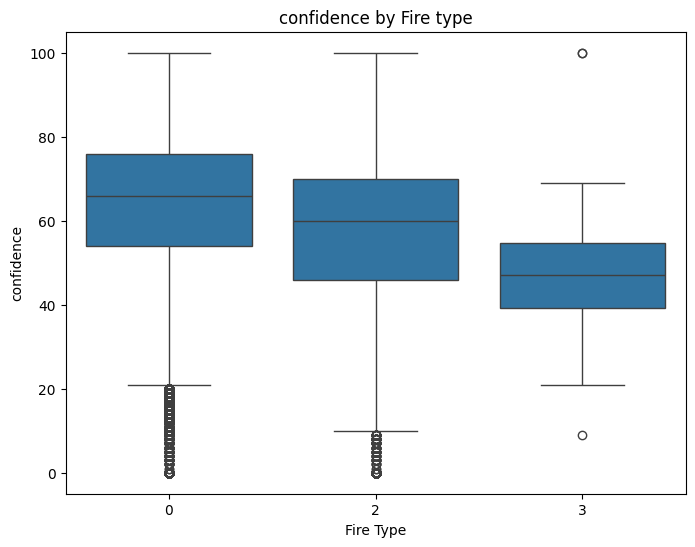

In [99]:
plt.figure(figsize=(8,6))
sns.boxplot(x='type',y='confidence',data=df)
plt.title('confidence by Fire type')
plt.xlabel('Fire Type')
plt.ylabel('confidence')
plt.show()

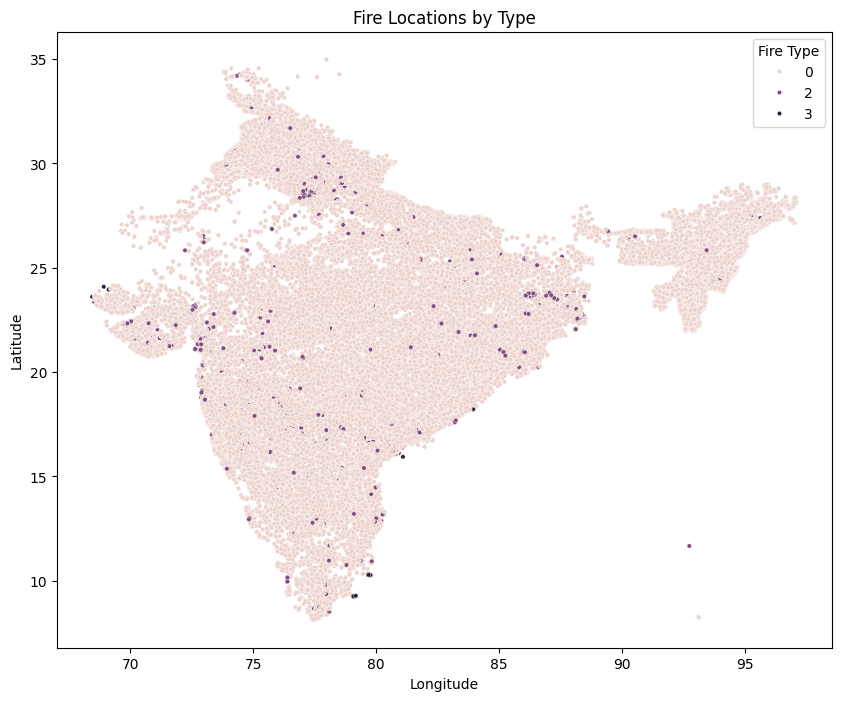

In [100]:
plt.figure(figsize=(10,8))
sns.scatterplot(x='longitude',y='latitude',data=df,hue='type',s=10)
plt.title('Fire Locations by Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Fire Type')
plt.show()

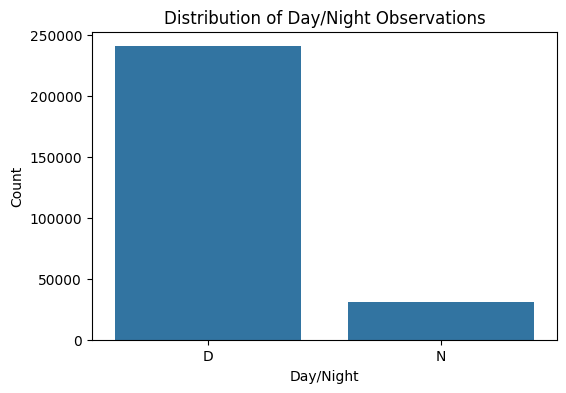

In [101]:
plt.figure(figsize=(6,4))
sns.countplot(x='daynight', data=df)
plt.title('Distribution of Day/Night Observations')
plt.xlabel('Day/Night')
plt.ylabel('Count')
plt.show()


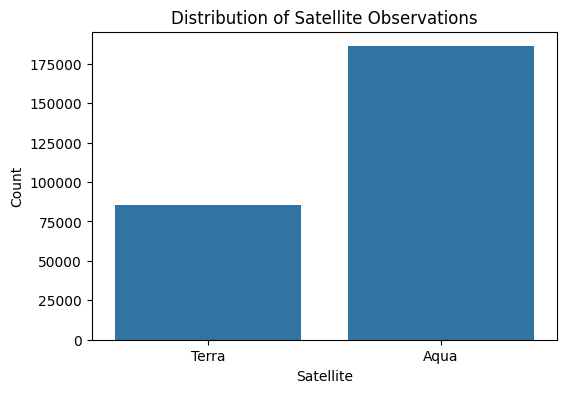

In [102]:
plt.figure(figsize=(6,4))
sns.countplot(x='satellite', data=df)
plt.title('Distribution of Satellite Observations')
plt.xlabel('Satellite')
plt.ylabel('Count')
plt.show()


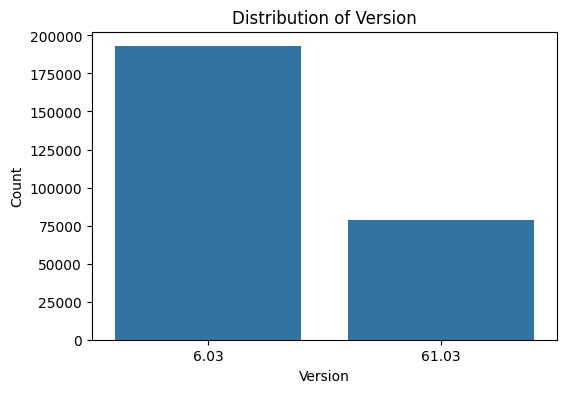

In [103]:
plt.figure(figsize=(6, 4))
sns.countplot(x='version', data=df)
plt.title('Distribution of Version')
plt.xlabel('Version')
plt.ylabel('Count')
plt.show()

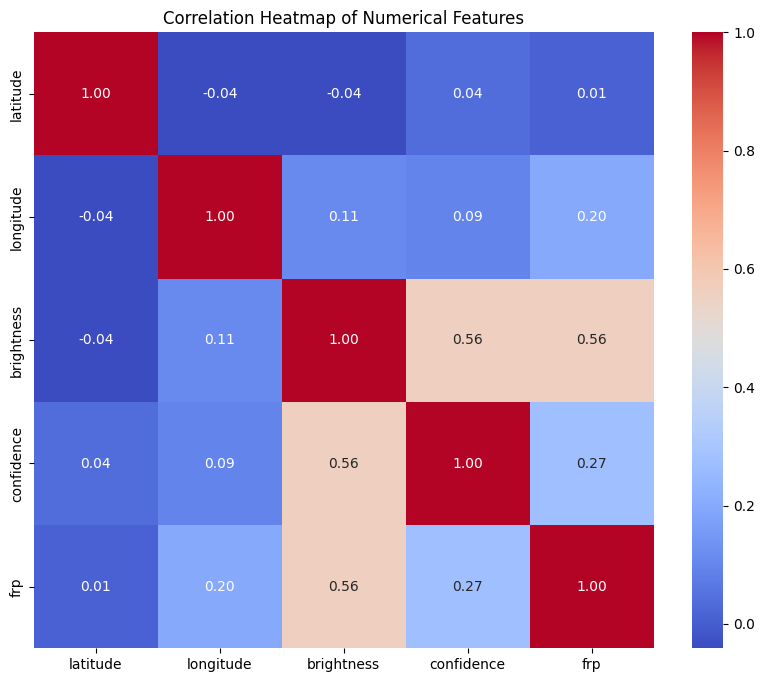

In [104]:
plt.figure(figsize=(10, 8))
correlation_matrix = df[['latitude', 'longitude', 'brightness', 'confidence', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [105]:
numerical_cols = df.select_dtypes(include=np.number).columns


In [106]:
numerical_cols

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_time',
       'confidence', 'version', 'bright_t31', 'frp', 'type'],
      dtype='object')

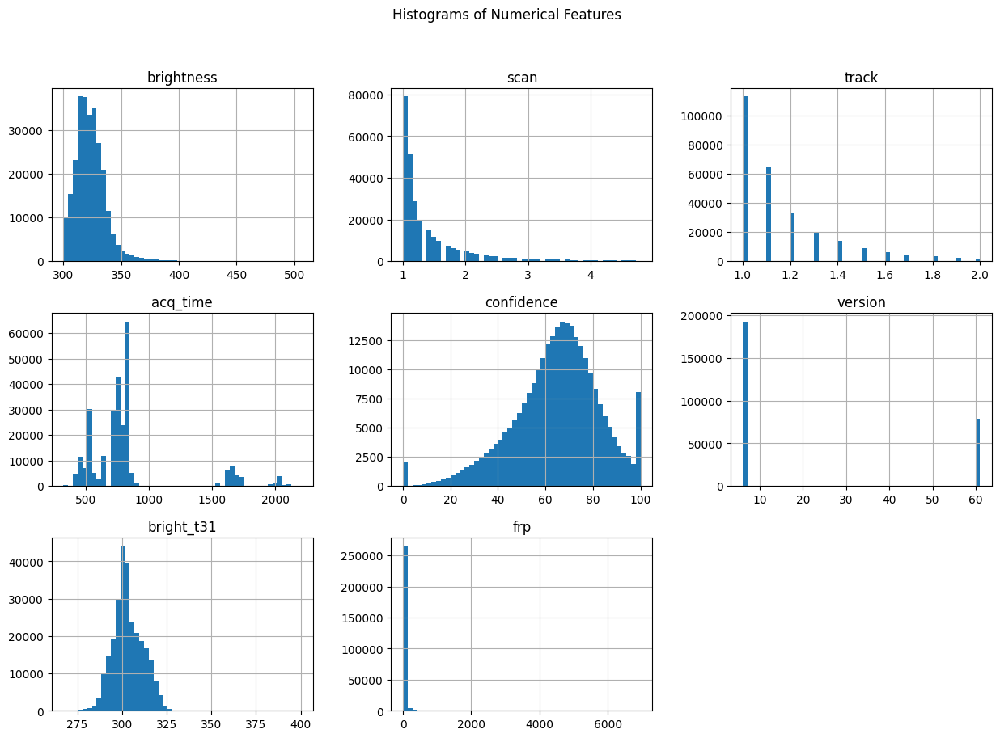

In [107]:
numerical_cols = ['brightness', 'scan', 'track', 'acq_time','confidence', 'version', 'bright_t31', 'frp']
df[numerical_cols].hist(bins=50, figsize=(15, 10))
plt.suptitle('Histograms of Numerical Features')
plt.show()

In [108]:
!pip install statsmodels

Analyzing distribution for: brightness


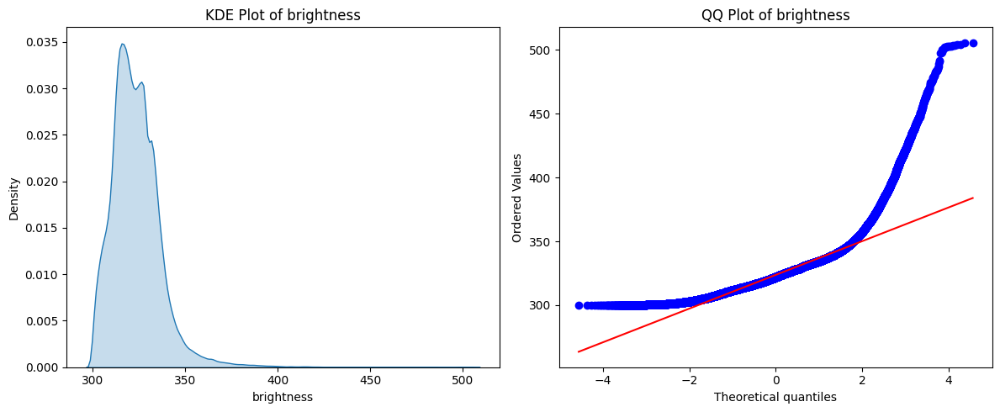

--------------------------------------------------
Analyzing distribution for: confidence


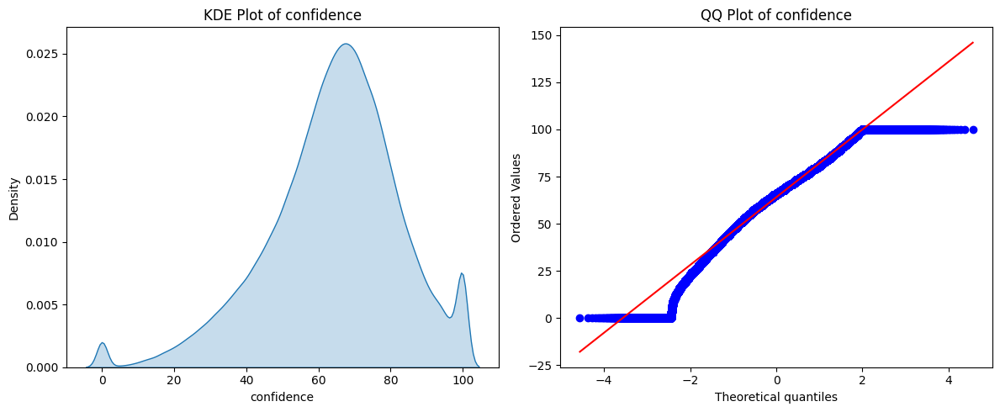

--------------------------------------------------
Analyzing distribution for: frp


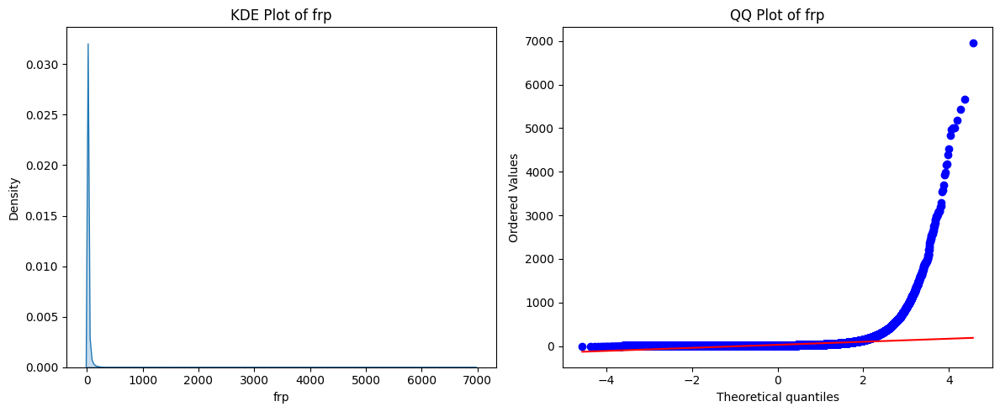

--------------------------------------------------
Analyzing distribution for: bright_t31


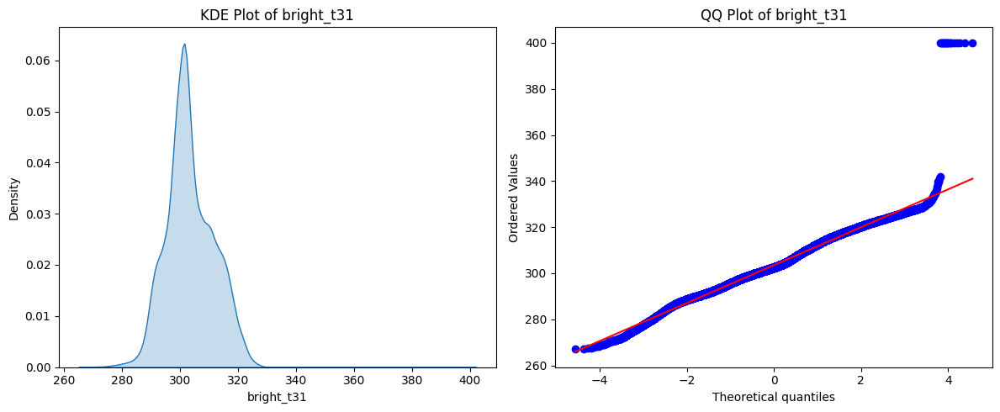

--------------------------------------------------
Analyzing distribution for: scan


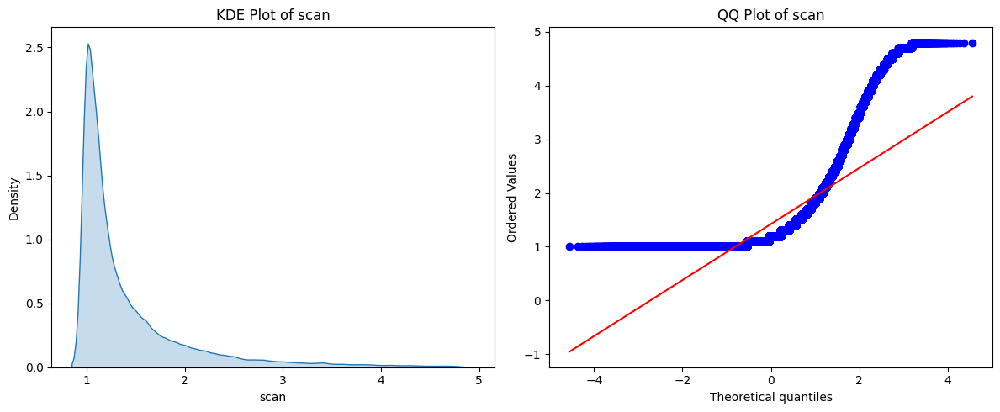

--------------------------------------------------
Analyzing distribution for: track


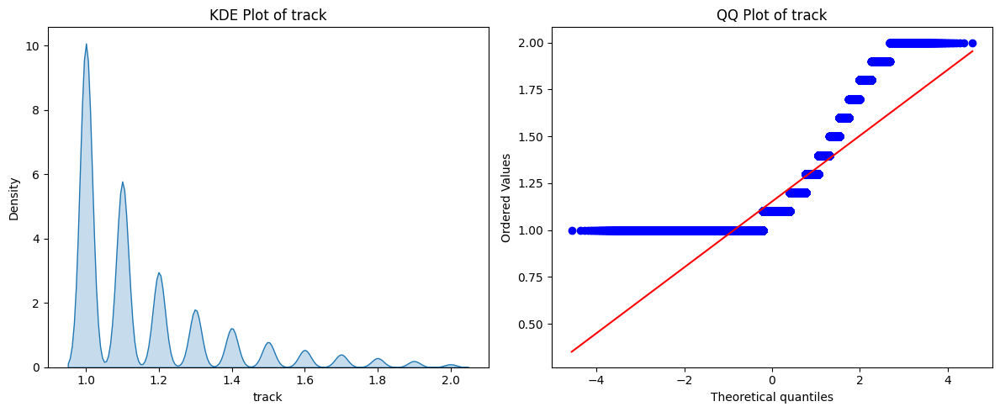

--------------------------------------------------


In [109]:
import statsmodels.api as sm
import scipy.stats as stats

# List of numerical features to check for distribution
numerical_features = ['brightness', 'confidence', 'frp', 'bright_t31', 'scan', 'track']

for feature in numerical_features:
    print(f"Analyzing distribution for: {feature}")

    # KDE Plot
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    sns.kdeplot(df[feature], fill=True)
    plt.title(f'KDE Plot of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')

    # QQ Plot
    plt.subplot(1, 2, 2)
    stats.probplot(df[feature], dist="norm", plot=plt)
    plt.title(f'QQ Plot of {feature}')

    plt.tight_layout()
    plt.show()
    print("-" * 50)

In [110]:
df['acq_date'] = pd.to_datetime(df['acq_date'])
# Extract temporal features
df['year'] = df['acq_date'].dt.year
df['month'] = df['acq_date'].dt.month
df['day_of_week'] = df['acq_date'].dt.dayofweek # Monday=0, Sunday=6
df['day_of_year'] = df['acq_date'].dt.dayofyear
df['hour'] = df['acq_time'].astype(str).str[:2].astype(int)

/tmp/ipython-input-2672674236.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='month', palette='viridis')


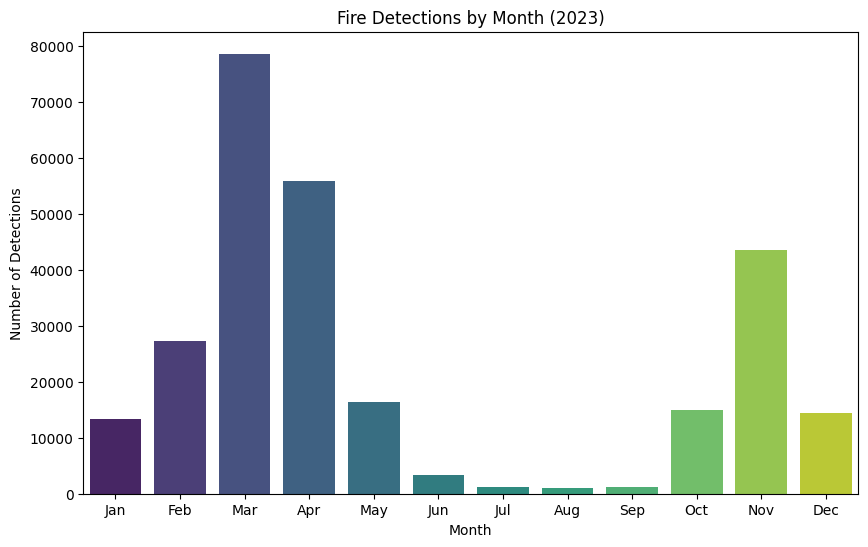

In [111]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='month', palette='viridis')
plt.title('Fire Detections by Month (2023)')
plt.xlabel('Month')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

/tmp/ipython-input-1413927136.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='day_of_week', palette='viridis')


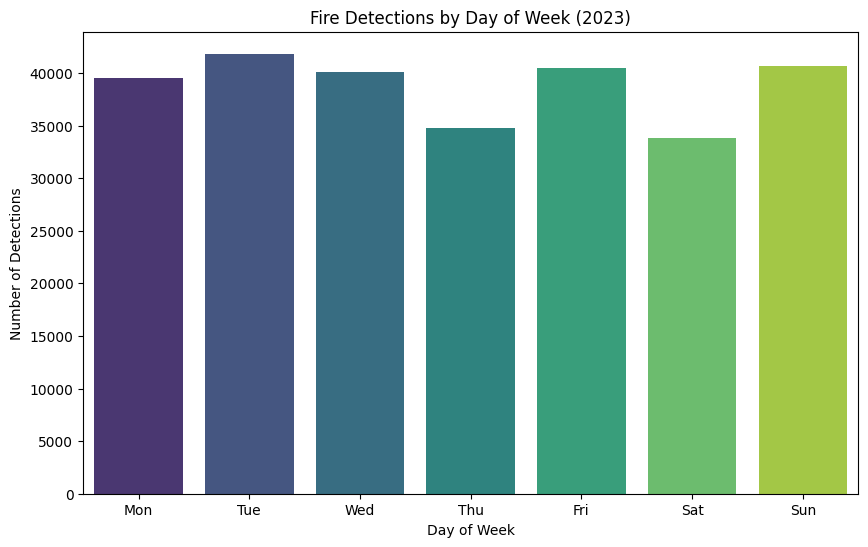

In [112]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='day_of_week', palette='viridis')
plt.title('Fire Detections by Day of Week (2023)')
plt.xlabel('Day of Week')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()

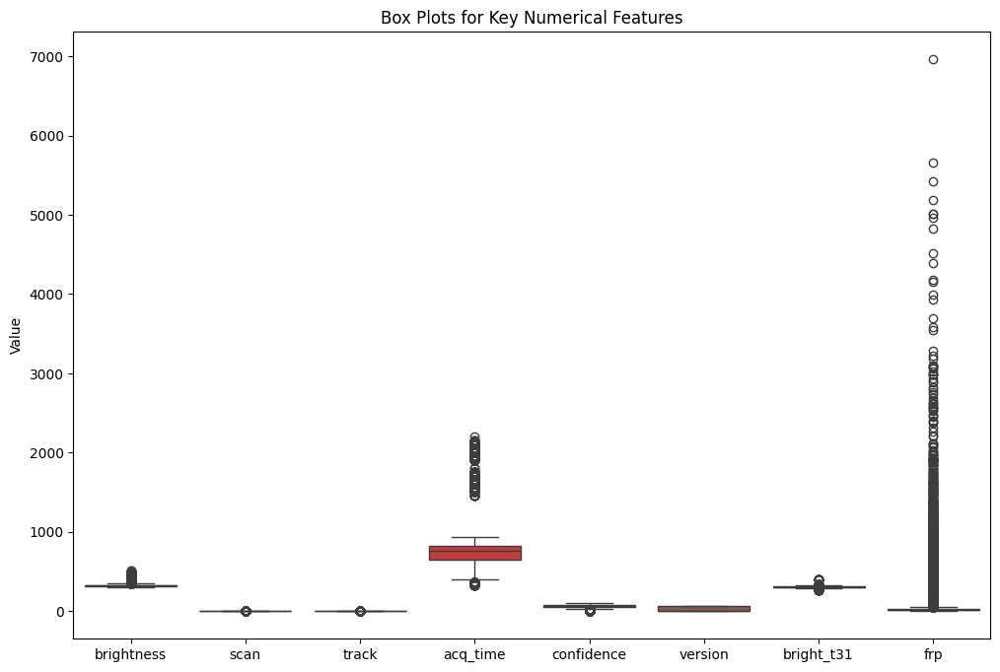

In [113]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[numerical_cols])
plt.title('Box Plots for Key Numerical Features')
plt.ylabel('Value')
plt.show()

In [114]:
def remove_outliers_iqr(df, column):
  Q1 = df[column].quantile(0.25)
  Q3 = df[column].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  df_cleaned = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)].copy()
  return df_cleaned

# Apply outlier removal to numerical columns
for col in numerical_cols:
  df = remove_outliers_iqr(df, col)

print("Shape after removing outliers:", df.shape)

Shape after removing outliers: (189370, 20)


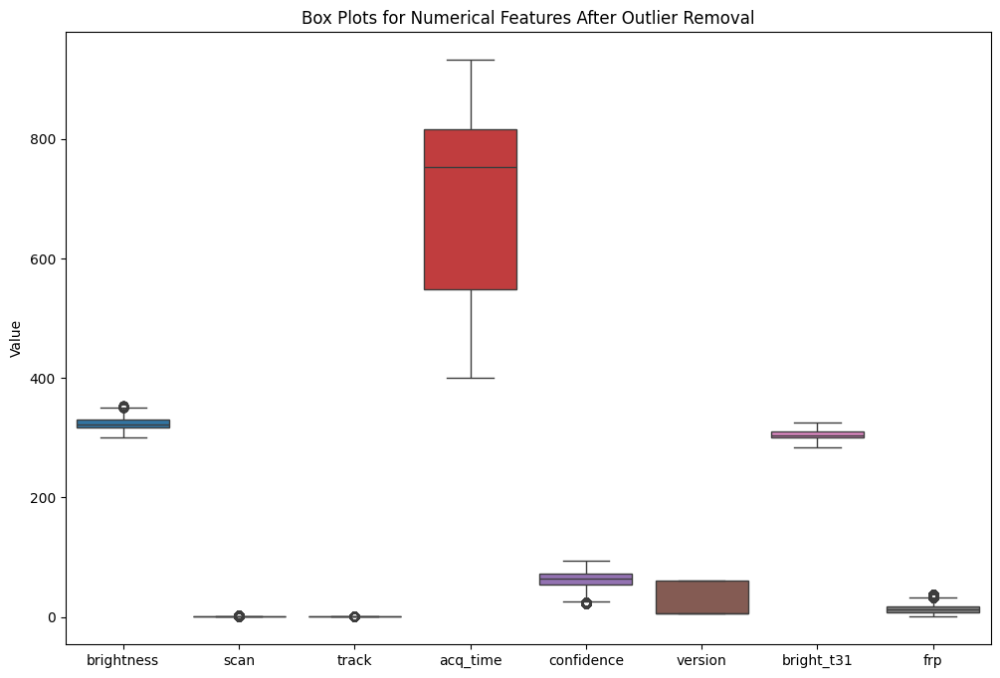

In [115]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[numerical_cols])
plt.title('Box Plots for Numerical Features After Outlier Removal')
plt.ylabel('Value')
plt.show()

In [116]:
df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type,year,month,day_of_week,day_of_year,hour
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,Terra,MODIS,44,6.03,292.6,8.6,D,0,2021,1,4,1,40
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,Terra,MODIS,37,6.03,287.4,9.0,D,0,2021,1,4,1,54
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,Terra,MODIS,46,6.03,287.7,10.7,D,0,2021,1,4,1,54
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,Terra,MODIS,43,6.03,287.6,9.0,D,0,2021,1,4,1,54
6,31.4366,76.8988,300.5,1.0,1.0,2021-01-01,547,Terra,MODIS,36,6.03,287.2,5.3,D,0,2021,1,4,1,54


In [117]:
df.type.value_counts()

,count
type,
0,182841
2,6501
3,28


In [118]:
categorical_cols = df.select_dtypes(include='object').columns

In [119]:
categorical_cols

Index(['satellite', 'instrument', 'daynight'], dtype='object')

In [120]:
categorical_cols_to_encode = ['daynight', 'satellite', 'instrument']

# Apply One-Hot Encoding
df_encoded = pd.get_dummies(df, columns=categorical_cols_to_encode, drop_first=True)

In [121]:
df_encoded.head(100)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,hour,satellite_Terra
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,409,44,6.03,292.6,8.6,0,2021,1,4,1,40,True
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,547,37,6.03,287.4,9.0,0,2021,1,4,1,54,True
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,547,46,6.03,287.7,10.7,0,2021,1,4,1,54,True
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,547,43,6.03,287.6,9.0,0,2021,1,4,1,54,True
6,31.4366,76.8988,300.5,1.0,1.0,2021-01-01,547,36,6.03,287.2,5.3,0,2021,1,4,1,54,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,23.7766,86.3997,313.8,1.0,1.0,2021-01-02,454,51,6.03,300.9,6.8,2,2021,1,5,2,45,True
117,23.6829,86.0831,310.4,1.1,1.0,2021-01-02,454,61,6.03,297.3,6.2,2,2021,1,5,2,45,True
118,23.6661,86.9215,308.2,1.0,1.0,2021-01-02,454,50,6.03,297.4,4.8,2,2021,1,5,2,45,True
119,23.8059,86.3222,313.5,1.0,1.0,2021-01-02,454,66,6.03,300.9,8.1,0,2021,1,5,2,45,True


In [122]:
df_encoded.type.value_counts()

,count
type,
0,182841
2,6501
3,28


In [123]:
import folium

# Create map and sample data
india_map = folium.Map(location=[22.351115, 78.667743], zoom_start=5)
sample_df = df_encoded.sample(n=min(10000, len(df_encoded)), random_state=42)

# Add markers
for _, row in sample_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=3,
        color='red',
        fill=True,
        fill_opacity=0.6,
        popup=f"FRP: {row['frp']:.2f}, Date: {row['acq_date'].strftime('%Y-%m-%d')}"
    ).add_to(india_map)

display(india_map)

In [124]:
scaler = StandardScaler()
numerical_cols_to_scale = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
df_encoded[numerical_cols_to_scale] = scaler.fit_transform(df_encoded[numerical_cols_to_scale])
df_encoded.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,hour,satellite_Terra
0,28.0993,96.9983,-2.308455,-0.464860,0.059274,2021-01-01,409,-1.319370,6.03,-1.754135,-0.735900,0,2021,1,4,1,40,True
1,30.0420,79.6492,-2.445530,0.588678,0.936416,2021-01-01,547,-1.818736,6.03,-2.471213,-0.683381,0,2021,1,4,1,54,True
3,30.0408,80.0501,-2.422684,0.939857,0.936416,2021-01-01,547,-1.176694,6.03,-2.429843,-0.460175,0,2021,1,4,1,54,True
4,30.6565,78.9668,-2.548336,0.237499,0.059274,2021-01-01,547,-1.390708,6.03,-2.443633,-0.683381,0,2021,1,4,1,54,True
6,31.4366,76.8988,-2.594027,-0.816039,-0.817867,2021-01-01,547,-1.890074,6.03,-2.498792,-1.169182,0,2021,1,4,1,54,True


In [125]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 189370 entries, 0 to 271207
Data columns (total 18 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   latitude         189370 non-null  float64       
 1   longitude        189370 non-null  float64       
 2   brightness       189370 non-null  float64       
 3   scan             189370 non-null  float64       
 4   track            189370 non-null  float64       
 5   acq_date         189370 non-null  datetime64[ns]
 6   acq_time         189370 non-null  int64         
 7   confidence       189370 non-null  float64       
 8   version          189370 non-null  float64       
 9   bright_t31       189370 non-null  float64       
 10  frp              189370 non-null  float64       
 11  type             189370 non-null  int64         
 12  year             189370 non-null  int32         
 13  month            189370 non-null  int32         
 14  day_of_week      189370 n

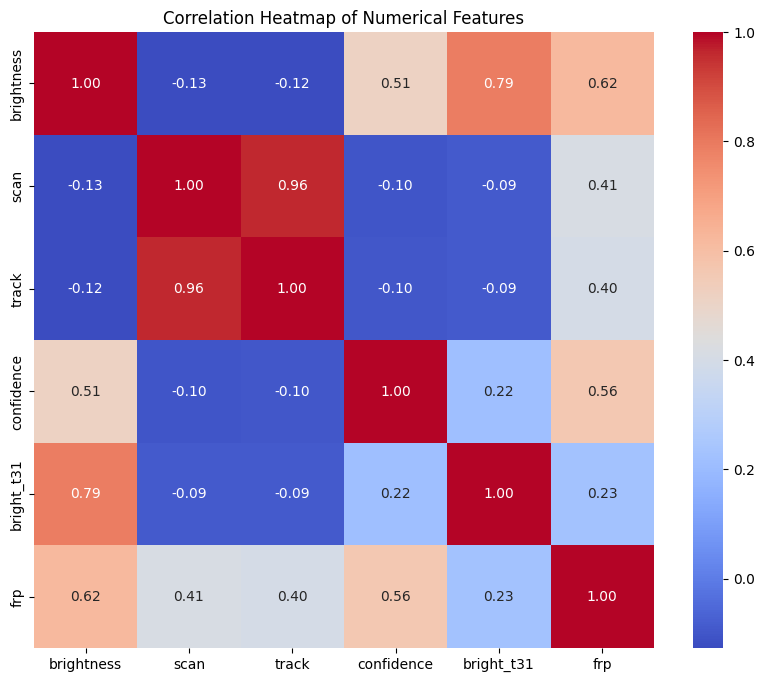

In [126]:
plt.figure(figsize=(10, 8))
correlation_matrix = df_encoded[['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [127]:
df_encoded.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,year,month,day_of_week,day_of_year,hour,satellite_Terra
0,28.0993,96.9983,-2.308455,-0.464860,0.059274,2021-01-01,409,-1.319370,6.03,-1.754135,-0.735900,0,2021,1,4,1,40,True
1,30.0420,79.6492,-2.445530,0.588678,0.936416,2021-01-01,547,-1.818736,6.03,-2.471213,-0.683381,0,2021,1,4,1,54,True
3,30.0408,80.0501,-2.422684,0.939857,0.936416,2021-01-01,547,-1.176694,6.03,-2.429843,-0.460175,0,2021,1,4,1,54,True
4,30.6565,78.9668,-2.548336,0.237499,0.059274,2021-01-01,547,-1.390708,6.03,-2.443633,-0.683381,0,2021,1,4,1,54,True
6,31.4366,76.8988,-2.594027,-0.816039,-0.817867,2021-01-01,547,-1.890074,6.03,-2.498792,-1.169182,0,2021,1,4,1,54,True


In [128]:
df_encoded.type.value_counts()

,count
type,
0,182841
2,6501
3,28


In [129]:
features = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
target = 'type'

X = df_encoded[features]
y = df_encoded[target]

In [130]:
X

,brightness,scan,track,confidence,bright_t31,frp
0,-2.308455,-0.464860,0.059274,-1.319370,-1.754135,-0.735900
1,-2.445530,0.588678,0.936416,-1.818736,-2.471213,-0.683381
3,-2.422684,0.939857,0.936416,-1.176694,-2.429843,-0.460175
4,-2.548336,0.237499,0.059274,-1.390708,-2.443633,-0.683381
6,-2.594027,-0.816039,-0.817867,-1.890074,-2.498792,-1.169182
...,...,...,...,...,...,...
271199,-0.423680,1.642216,1.813557,-0.605991,0.369517,0.327610
271200,-0.846327,3.398112,2.690698,-1.319370,-0.085551,0.209442
271201,-0.789212,1.993395,1.813557,-1.105356,-0.306191,-0.079412
271204,-0.115262,1.993395,1.813557,0.678093,0.093718,1.679975


In [131]:
y

,type
0,0
1,0
3,0
4,0
6,0
...,...
271199,0
271200,0
271201,0
271204,0


In [132]:
!pip install -U imbalanced-learn
from imblearn.over_sampling import SMOTE

In [133]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
from xgboost import XGBClassifier

# 1. Encode target labels to 0, 1, 2...
le = LabelEncoder()
y_encoded = le.fit_transform(df_encoded['type'])

# 2. Train-test split
X = df_encoded[features]
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

from imblearn.combine import SMOTETomek
smote = SMOTETomek(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)



In [134]:

# 4. Train XGBoost
model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
model.fit(X_train_resampled, y_train_resampled)

# 5. Predict and decode labels back
y_pred = model.predict(X_test)
y_pred_labels = le.inverse_transform(y_pred)
y_test_labels = le.inverse_transform(y_test)

# 6. Evaluation
print("Confusion Matrix:")
print(confusion_matrix(y_test_labels, y_pred_labels))

print("\nClassification Report:")
print(classification_report(y_test_labels, y_pred_labels))

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [15:32:35] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Confusion Matrix:
[[34353  2088   127]
 [  990   299    11]
 [    5     1     0]]

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.94      0.96     36568
           2       0.13      0.23      0.16      1300
           3       0.00      0.00      0.00         6

    accuracy                           0.91     37874
   macro avg       0.37      0.39      0.37     37874
weighted avg       0.94      0.91      0.93     37874



In [135]:
from sklearn.metrics import accuracy_score

# 1. Accuracy on training set
y_train_pred = model.predict(X_train_resampled)
train_accuracy = accuracy_score(le.inverse_transform(y_train_resampled), le.inverse_transform(y_train_pred))
print(f"Train Accuracy: {train_accuracy:.4f}")

# 2. Accuracy on test set
y_test_pred = model.predict(X_test)
test_accuracy = accuracy_score(le.inverse_transform(y_test), le.inverse_transform(y_test_pred))
print(f"Test Accuracy : {test_accuracy:.4f}")

# 3. Check for overfitting/underfitting
if train_accuracy > test_accuracy + 0.1:
    print(" Model is likely overfitting.")
elif test_accuracy > train_accuracy:
    print(" Model might be underfitting or data has imbalance/issues.")
else:
    print("Model is likely generalizing well.")


Train Accuracy: 0.9262
Test Accuracy : 0.9149
Model is likely generalizing well.


In [136]:
# 6. Evaluation
print("Train F1 Macro:", f1_score(y_train_resampled, y_train_pred, average='macro'))
print("Test F1 Macro :", f1_score(y_test, y_pred, average='macro'))

# Note: Use predict_proba for ROC AUC in multiclass
print("ROC AUC Score:", roc_auc_score(y_test, lr_model.predict_proba(X_test), multi_class='ovr'))

Train F1 Macro: 0.925707818453707
Test F1 Macro : 0.37250403248234054
ROC AUC Score: 0.7178745340173514


In [137]:
import shap

# Train your model (XGBoost already trained)
model = XGBClassifier()
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

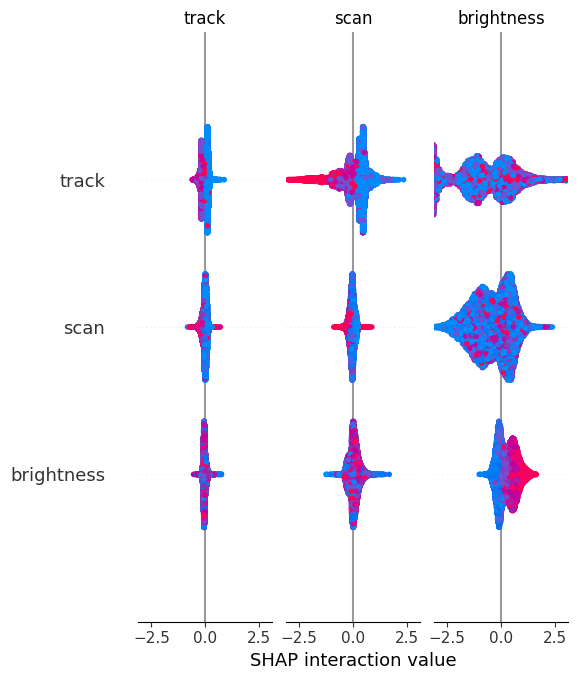

In [138]:
# Create the SHAP explainer
explainer = shap.TreeExplainer(model)

# Choose background and samples
shap_values = explainer.shap_values(X_test)

# Summary plot (global feature importance)
shap.summary_plot(shap_values, X_test, feature_names=features)

In [139]:
from sklearn.metrics import classification_report, confusion_matrix, f1_score, roc_auc_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

Train F1 Macro: 0.5920221541724143
Test F1 Macro : 0.25599274297988767
ROC AUC Score: 0.7178745340173514


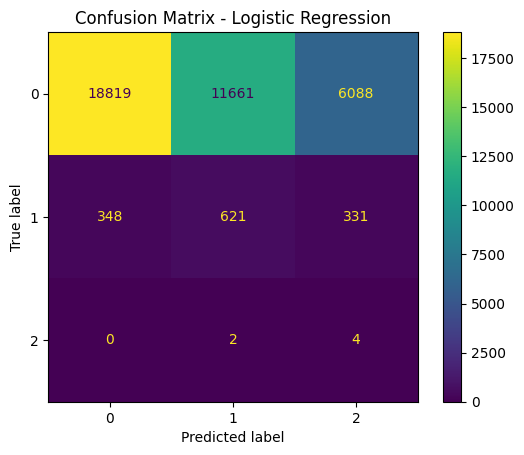


Classification Report:
              precision    recall  f1-score   support

           0     0.9818    0.5146    0.6753     36568
           2     0.0506    0.4777    0.0914      1300
           3     0.0006    0.6667    0.0012         6

    accuracy                         0.5134     37874
   macro avg     0.3443    0.5530    0.2560     37874
weighted avg     0.9497    0.5134    0.6552     37874



In [140]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, f1_score, roc_auc_score, ConfusionMatrixDisplay
import matplotlib.pyplot as plt


# 4. Train Logistic Regression on SMOTE-resampled data
lr_model = LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)
lr_model.fit(X_train_resampled, y_train_resampled)

# 5. Make predictions on original test set
y_pred_lr = lr_model.predict(X_test)
y_train_pred_lr = lr_model.predict(X_train_resampled)

# 6. Evaluation
print("Train F1 Macro:", f1_score(y_train_resampled, y_train_pred_lr, average='macro'))
print("Test F1 Macro :", f1_score(y_test, y_pred_lr, average='macro'))

# Note: Use predict_proba for ROC AUC in multiclass
print("ROC AUC Score:", roc_auc_score(y_test, lr_model.predict_proba(X_test), multi_class='ovr'))

# 7. Confusion Matrix
ConfusionMatrixDisplay.from_estimator(lr_model, X_test, y_test)
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

# 8. Detailed Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_lr, target_names=[str(cls) for cls in le.classes_], digits=4))

Train Accuracy   : 0.82706904644693
Test Accuracy    : 0.6918202460791044
Train F1 Macro   : 0.8245090374886989
Test F1 Macro    : 0.3135401792454892
ROC AUC Score    : 0.7679244634747605


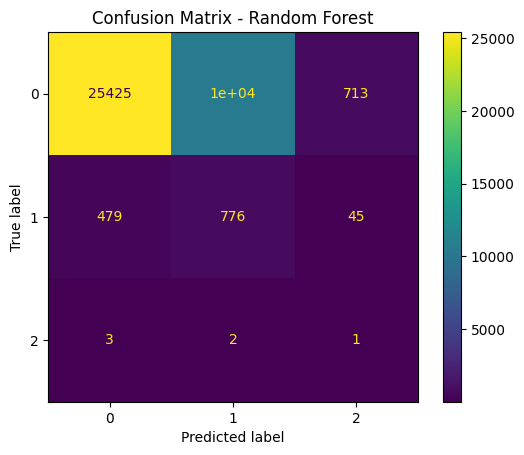


Classification Report:
              precision    recall  f1-score   support

           0     0.9814    0.6953    0.8139     36568
           2     0.0692    0.5969    0.1241      1300
           3     0.0013    0.1667    0.0026         6

    accuracy                         0.6918     37874
   macro avg     0.3506    0.4863    0.3135     37874
weighted avg     0.9499    0.6918    0.7901     37874



In [141]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, f1_score, roc_auc_score, ConfusionMatrixDisplay, accuracy_score
import matplotlib.pyplot as plt

# 4. Train Random Forest on SMOTE-resampled data
rf_model = RandomForestClassifier(
    n_estimators=100,
    max_depth=10,
    class_weight='balanced',
    random_state=42
)
rf_model.fit(X_train_resampled, y_train_resampled)

# 5. Make predictions
y_train_pred_rf = rf_model.predict(X_train_resampled)
y_pred_rf = rf_model.predict(X_test)

# 6. Evaluation
print("Train Accuracy   :", accuracy_score(y_train_resampled, y_train_pred_rf))
print("Test Accuracy    :", accuracy_score(y_test, y_pred_rf))
print("Train F1 Macro   :", f1_score(y_train_resampled, y_train_pred_rf, average='macro'))
print("Test F1 Macro    :", f1_score(y_test, y_pred_rf, average='macro'))
print("ROC AUC Score    :", roc_auc_score(y_test, rf_model.predict_proba(X_test), multi_class='ovr'))

# 7. Confusion Matrix
ConfusionMatrixDisplay.from_estimator(rf_model, X_test, y_test)
plt.title("Confusion Matrix - Random Forest")
plt.show()

# 8. Detailed Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf, target_names=[str(cls) for cls in le.classes_], digits=4))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008015 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1530
[LightGBM] [Info] Number of data points in the train set: 436735, number of used features: 6
[LightGBM] [Info] Start training from score -1.101001
[LightGBM] [Info] Start training from score -1.101001
[LightGBM] [Info] Start training from score -1.093852
Train Accuracy   : 0.9330646730855096
Test Accuracy    : 0.9284733590325818
Train F1 Macro   : 0.9325672631485298
Test F1 Macro    : 0.3741766910566367
ROC AUC Score    : 0.7764297442918816


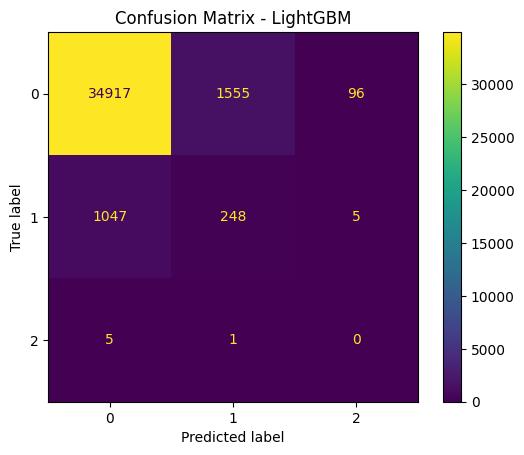


Classification Report:
              precision    recall  f1-score   support

           0     0.9708    0.9549    0.9627     36568
           2     0.1375    0.1908    0.1598      1300
           3     0.0000    0.0000    0.0000         6

    accuracy                         0.9285     37874
   macro avg     0.3694    0.3819    0.3742     37874
weighted avg     0.9420    0.9285    0.9350     37874



In [142]:
from lightgbm import LGBMClassifier


# 4. Train LightGBM on SMOTE-resampled data
lgb_model = LGBMClassifier(random_state=42)
lgb_model.fit(X_train_resampled, y_train_resampled)

# 5. Make predictions
y_train_pred_lgb = lgb_model.predict(X_train_resampled)
y_pred_lgb = lgb_model.predict(X_test)

# 6. Evaluation
print("Train Accuracy   :", accuracy_score(y_train_resampled, y_train_pred_lgb))
print("Test Accuracy    :", accuracy_score(y_test, y_pred_lgb))
print("Train F1 Macro   :", f1_score(y_train_resampled, y_train_pred_lgb, average='macro'))
print("Test F1 Macro    :", f1_score(y_test, y_pred_lgb, average='macro'))
print("ROC AUC Score    :", roc_auc_score(y_test, lgb_model.predict_proba(X_test), multi_class='ovr'))

# 7. Confusion Matrix
ConfusionMatrixDisplay.from_estimator(lgb_model, X_test, y_test)
plt.title("Confusion Matrix - LightGBM")
plt.show()

# 8. Detailed Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_lgb, target_names=[str(cls) for cls in le.classes_], digits=4))

In [143]:
!pip install catboost

Train Accuracy   : 0.9543933964532267
Test Accuracy    : 0.9519195226276601
Train F1 Macro   : 0.9540065554077121
Test F1 Macro    : 0.37115087878054304
ROC AUC Score    : 0.7960681721452261


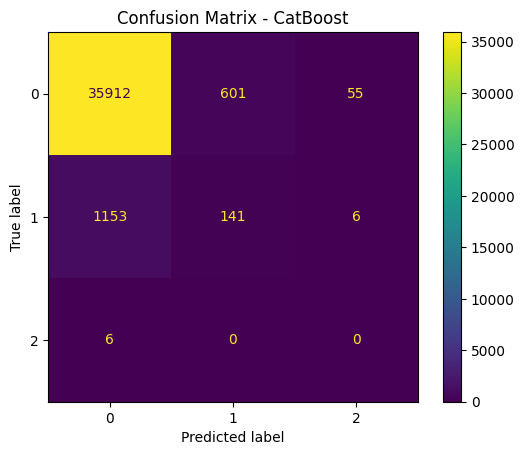


Classification Report:
              precision    recall  f1-score   support

           0     0.9687    0.9821    0.9754     36568
           2     0.1900    0.1085    0.1381      1300
           3     0.0000    0.0000    0.0000         6

    accuracy                         0.9519     37874
   macro avg     0.3863    0.3635    0.3712     37874
weighted avg     0.9419    0.9519    0.9465     37874



In [144]:
from catboost import CatBoostClassifier

# 4. Train CatBoost on SMOTE-resampled data
cat_model = CatBoostClassifier(verbose=0, random_state=42)
cat_model.fit(X_train_resampled, y_train_resampled)

# 5. Make predictions
y_train_pred_cat = cat_model.predict(X_train_resampled)
y_pred_cat = cat_model.predict(X_test)

# 6. Evaluation
print("Train Accuracy   :", accuracy_score(y_train_resampled, y_train_pred_cat))
print("Test Accuracy    :", accuracy_score(y_test, y_pred_cat))
print("Train F1 Macro   :", f1_score(y_train_resampled, y_train_pred_cat, average='macro'))
print("Test F1 Macro    :", f1_score(y_test, y_pred_cat, average='macro'))
print("ROC AUC Score    :", roc_auc_score(y_test, cat_model.predict_proba(X_test), multi_class='ovr'))

# 7. Confusion Matrix
ConfusionMatrixDisplay.from_estimator(cat_model, X_test, y_test)
plt.title("Confusion Matrix - CatBoost")
plt.show()

# 8. Detailed Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_cat, target_names=[str(cls) for cls in le.classes_], digits=4))

Train Accuracy   : 0.9580912910575062
Test Accuracy    : 0.8087342240059143
Train F1 Macro   : 0.9578234210570882
Test F1 Macro    : 0.3323444763002591
ROC AUC Score    : 0.56572109033634


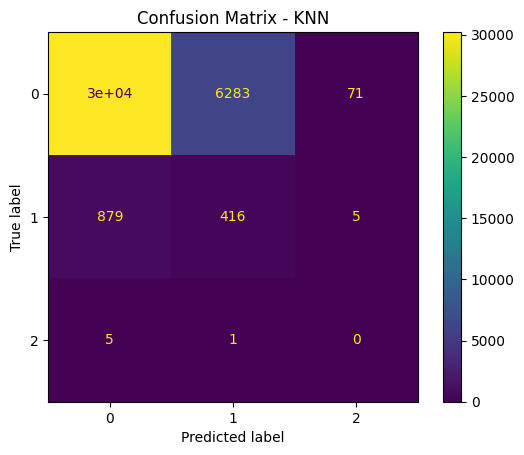


Classification Report:
              precision    recall  f1-score   support

           0     0.9716    0.8262    0.8930     36568
           2     0.0621    0.3200    0.1040      1300
           3     0.0000    0.0000    0.0000         6

    accuracy                         0.8087     37874
   macro avg     0.3446    0.3821    0.3323     37874
weighted avg     0.9402    0.8087    0.8658     37874



In [146]:
from sklearn.neighbors import KNeighborsClassifier


# 4. Train KNN on SMOTE-resampled data
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train_resampled, y_train_resampled)

# 5. Make predictions
y_train_pred_knn = knn_model.predict(X_train_resampled)
y_pred_knn = knn_model.predict(X_test)

# 6. Evaluation
print("Train Accuracy   :", accuracy_score(y_train_resampled, y_train_pred_knn))
print("Test Accuracy    :", accuracy_score(y_test, y_pred_knn))
print("Train F1 Macro   :", f1_score(y_train_resampled, y_train_pred_knn, average='macro'))
print("Test F1 Macro    :", f1_score(y_test, y_pred_knn, average='macro'))
print("ROC AUC Score    :", roc_auc_score(y_test, knn_model.predict_proba(X_test), multi_class='ovr'))

# 7. Confusion Matrix
ConfusionMatrixDisplay.from_estimator(knn_model, X_test, y_test)
plt.title("Confusion Matrix - KNN")
plt.show()

# 8. Detailed Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_knn, target_names=[str(cls) for cls in le.classes_], digits=4))

Train Accuracy   : 0.8364156754095733
Test Accuracy    : 0.7202566404393516
Train F1 Macro   : 0.8358658207523891
Test F1 Macro    : 0.31955004174587215
ROC AUC Score    : 0.7985846454684525


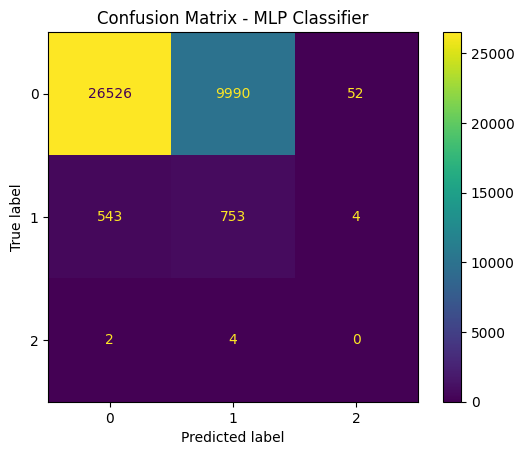


Classification Report:
              precision    recall  f1-score   support

           0     0.9799    0.7254    0.8336     36568
           2     0.0701    0.5792    0.1250      1300
           3     0.0000    0.0000    0.0000         6

    accuracy                         0.7203     37874
   macro avg     0.3500    0.4349    0.3196     37874
weighted avg     0.9485    0.7203    0.8092     37874



In [147]:
from sklearn.neural_network import MLPClassifier


# 4. Train MLP Classifier on SMOTE-resampled data
mlp_model = MLPClassifier(hidden_layer_sizes=(64, 32), max_iter=500, random_state=42)
mlp_model.fit(X_train_resampled, y_train_resampled)

# 5. Make predictions
y_train_pred_mlp = mlp_model.predict(X_train_resampled)
y_pred_mlp = mlp_model.predict(X_test)

# 6. Evaluation
print("Train Accuracy   :", accuracy_score(y_train_resampled, y_train_pred_mlp))
print("Test Accuracy    :", accuracy_score(y_test, y_pred_mlp))
print("Train F1 Macro   :", f1_score(y_train_resampled, y_train_pred_mlp, average='macro'))
print("Test F1 Macro    :", f1_score(y_test, y_pred_mlp, average='macro'))
print("ROC AUC Score    :", roc_auc_score(y_test, mlp_model.predict_proba(X_test), multi_class='ovr'))

# 7. Confusion Matrix
ConfusionMatrixDisplay.from_estimator(mlp_model, X_test, y_test)
plt.title("Confusion Matrix - MLP Classifier")
plt.show()


# 8. Detailed Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_mlp, target_names=[str(cls) for cls in le.classes_], digits=4))

In [150]:
import joblib

# Save the best model
# Based on the previous output, let's assume Random Forest was the best model.
best_model = cat_model

joblib.dump(best_model, 'best_fire_detection_model.pkl')

# Save the StandardScaler instance
joblib.dump(scaler, 'scaler.pkl')

print("Best model and scaler saved successfully.")

Best model and scaler saved successfully.
